# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
#plt.rcParams.update({'figure.max_open_warning': 0})
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = "true"

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1763188279.782305  156304 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763188279.789435  156304 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763188279.809556  156304 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763188279.809598  156304 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763188279.809601  156304 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763188279.809605  156304 computation_placer.cc:177] computation placer already registered. Please check linka

Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# DATA FROM VIET

## Load dataset

In [3]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Lowercase columns name
df_raw.columns = df_raw.columns.map(lambda col: col.lower().strip())

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## EDA

Station = 211


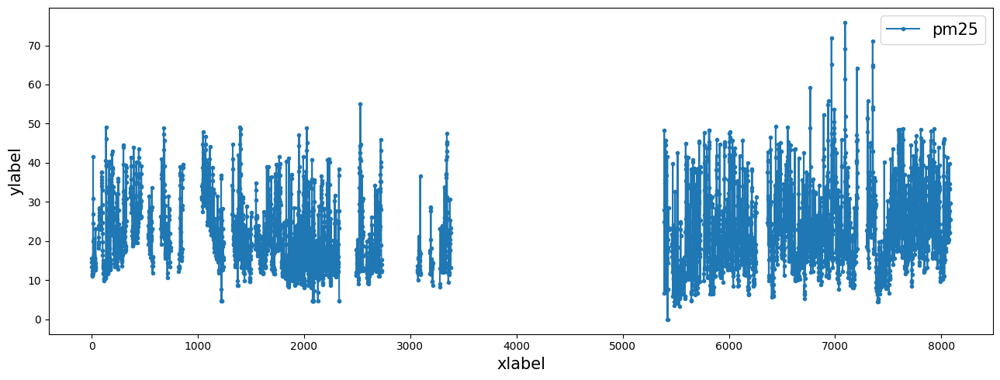

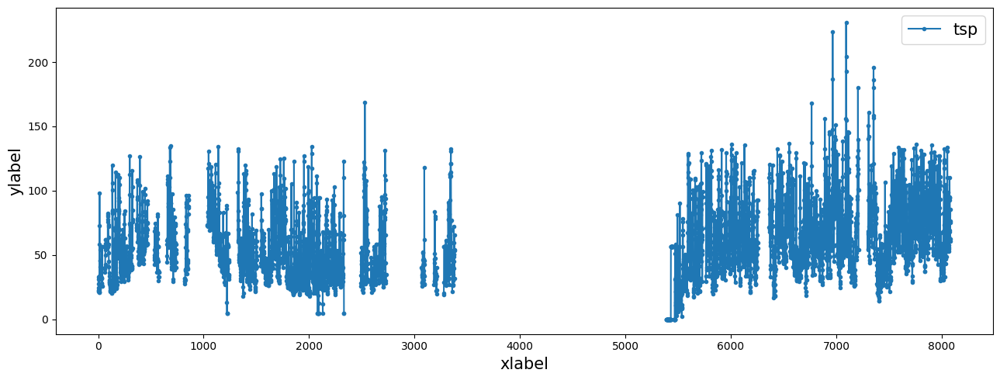

Station = 212


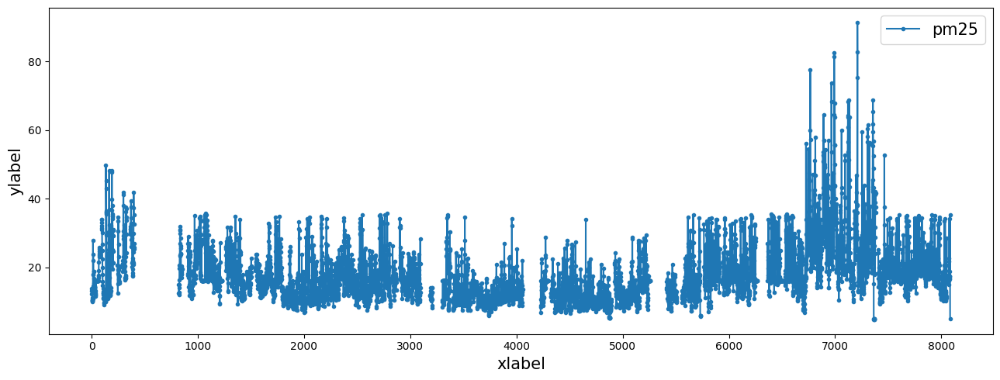

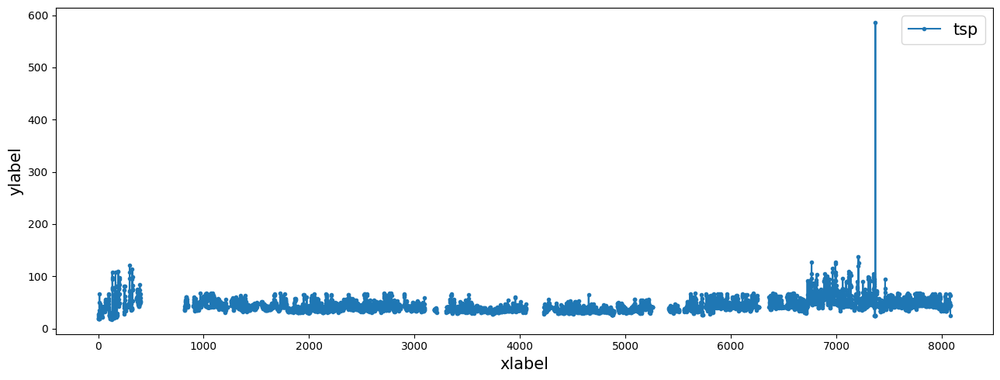

Station = 213


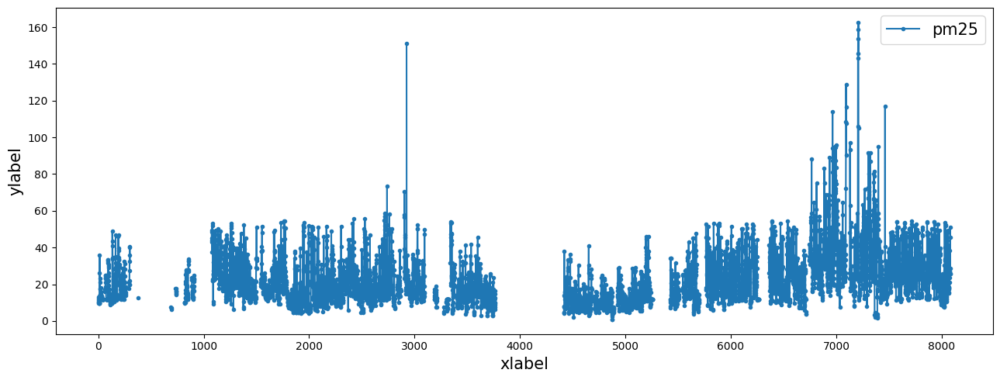

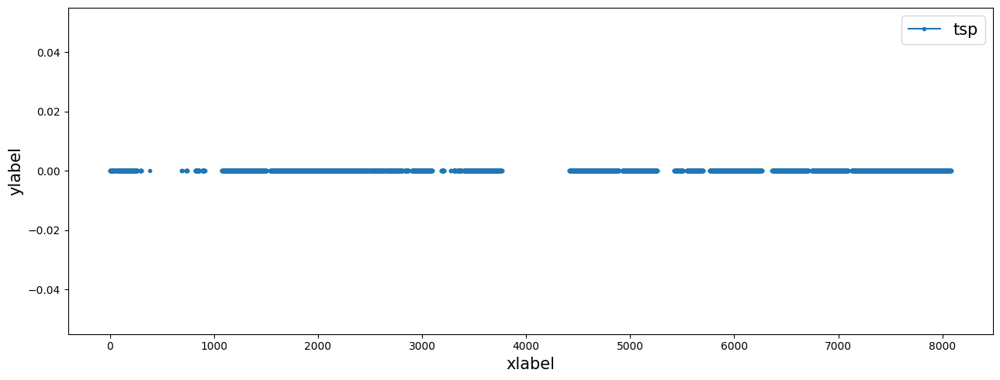

Station = 214


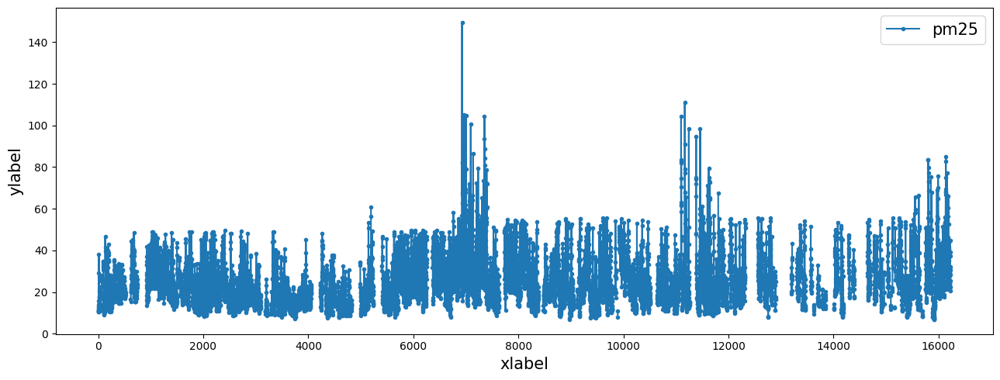

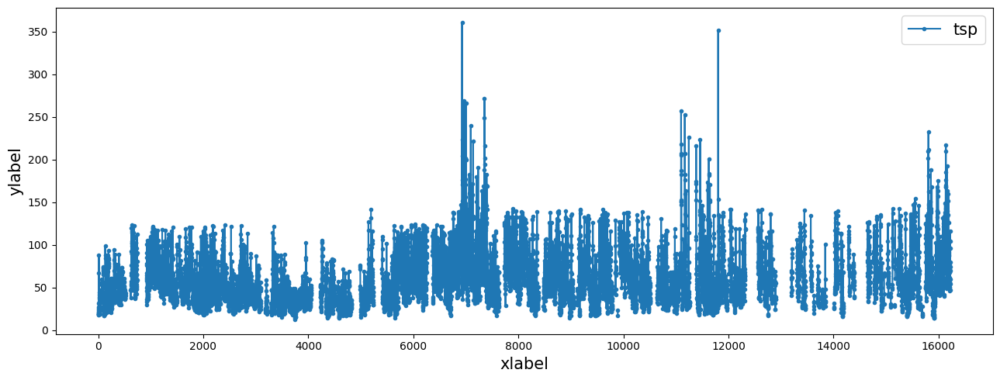

Station = 215


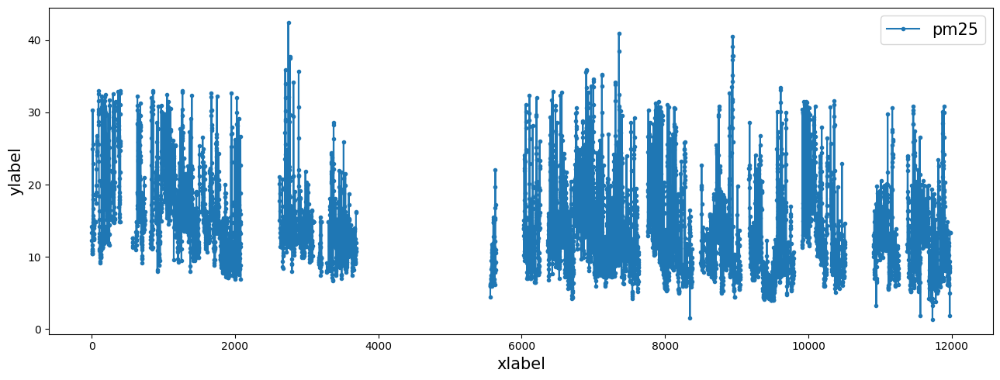

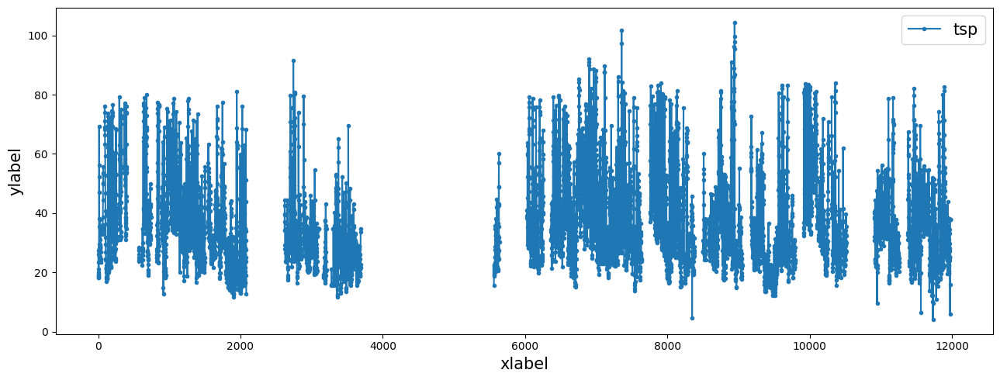

Station = 216


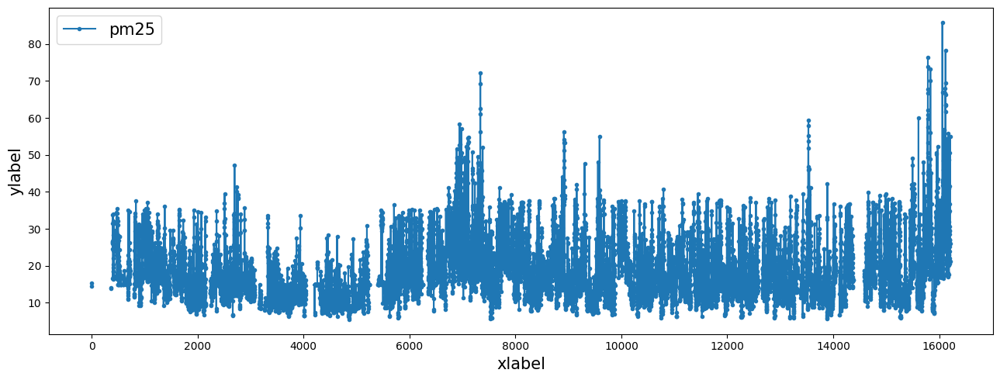

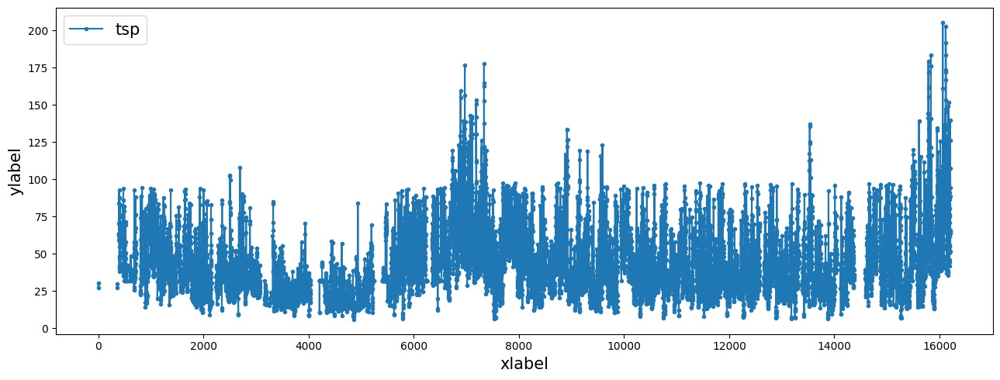

In [4]:
for station in sorted(df_raw["station"].unique()):
    print(f"Station = {station}")
    df_station = df_raw[df_raw["station"] == station]
    plot_1_data(data=df_station["pm25_quantrac"], datalabel="pm25")
    plot_1_data(data=df_station["tsp_quantrac"], datalabel="tsp")

## Data preparation

### Drop missing

In [5]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [6]:
df_scaled = copy.deepcopy(df)

# Scale features
features_to_scale = ["tsp_quantrac"]
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Scale label
label = "pm25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

df_scaled

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,0.096032,0.091311,211
2021-02-23 22:00:00,0.089813,0.085757,211
2021-02-23 23:00:00,0.082690,0.076643,211
2021-02-24 00:00:00,0.076095,0.067591,211
2021-02-24 01:00:00,0.071612,0.062439,211
...,...,...,...
2022-12-31 19:00:00,0.255085,0.297899,216
2022-12-31 20:00:00,0.310963,0.349789,216
2022-12-31 21:00:00,0.338810,0.387272,216


### Features engineering

In [7]:
# Apply sin/cos to hour
k = 24
df_scaled["sintime"] = np.sin(2 * np.pi * (df_scaled.index.hour / k))
df_scaled["costime"] = np.cos(2 * np.pi * (df_scaled.index.hour / k))

# Convert station to one-hot vector
onehot = OneHotEncoder(sparse_output=False)
onehot_encoded_location = pd.DataFrame(onehot.fit_transform(df_scaled[["station"]]), columns=df_scaled["station"].unique(), index=df_scaled.index)
df_scaled = pd.concat([df_scaled, onehot_encoded_location], axis=1)
df_scaled

,pm25_quantrac,tsp_quantrac,station,sintime,costime,211,212,213,214,215,216
date,,,,,,,,,,,
2021-02-23 21:00:00,0.096032,0.091311,211,-0.707107,0.707107,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 22:00:00,0.089813,0.085757,211,-0.500000,0.866025,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 23:00:00,0.082690,0.076643,211,-0.258819,0.965926,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 00:00:00,0.076095,0.067591,211,0.000000,1.000000,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 01:00:00,0.071612,0.062439,211,0.258819,0.965926,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.255085,0.297899,216,-0.965926,0.258819,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 20:00:00,0.310963,0.349789,216,-0.866025,0.500000,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 21:00:00,0.338810,0.387272,216,-0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,1.0


### Train test split

In [8]:
# For each station, use 80% data for training, 20% data for testing
train_data = []
test_data = []
for station in sorted(df_scaled["station"].unique()):
    df_station = df_scaled[df_scaled["station"] == station]
    splitter = round(0.8 * len(df_station))
    
    print(f"Station = {station}\
    \nstart = {df_station.iloc[0].name}\
    \nsplitter = {df_station.iloc[splitter].name}\
    \nend = {df_station.iloc[-1].name}\
    \n=================================================")

    train_data.append(df_station.iloc[:splitter])
    test_data.append(df_station.iloc[splitter:])

train_data, test_data = pd.concat(train_data, axis=0), pd.concat(test_data, axis=0)

display(train_data)
display(test_data)

Station = 211    
start = 2021-02-23 21:00:00    
splitter = 2021-12-15 20:00:00    
end = 2022-01-26 16:00:00    
Station = 212    
start = 2021-02-23 21:00:00    
splitter = 2021-12-01 08:00:00    
end = 2022-01-26 16:00:00    
Station = 213    
start = 2021-02-23 21:00:00    
splitter = 2021-12-06 21:00:00    
end = 2022-01-26 16:00:00    
Station = 214    
start = 2021-02-23 21:00:00    
splitter = 2022-06-21 22:00:00    
end = 2022-12-31 23:00:00    
Station = 215    
start = 2021-02-23 21:00:00    
splitter = 2022-04-14 20:00:00    
end = 2022-07-08 00:00:00    
Station = 216    
start = 2021-02-24 16:00:00    
splitter = 2022-08-19 09:00:00    
end = 2022-12-31 23:00:00    


,pm25_quantrac,tsp_quantrac,station,sintime,costime,211,212,213,214,215,216
date,,,,,,,,,,,
2021-02-23 21:00:00,0.096032,0.091311,211,-0.707107,7.071068e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 22:00:00,0.089813,0.085757,211,-0.500000,8.660254e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 23:00:00,0.082690,0.076643,211,-0.258819,9.659258e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 00:00:00,0.076095,0.067591,211,0.000000,1.000000e+00,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 01:00:00,0.071612,0.062439,211,0.258819,9.659258e-01,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 04:00:00,0.072966,0.064523,216,0.866025,5.000000e-01,0.0,0.0,0.0,0.0,0.0,1.0
2022-08-19 05:00:00,0.111111,0.105074,216,0.965926,2.588190e-01,0.0,0.0,0.0,0.0,0.0,1.0
2022-08-19 06:00:00,0.080526,0.074799,216,1.000000,6.123234e-17,0.0,0.0,0.0,0.0,0.0,1.0


,pm25_quantrac,tsp_quantrac,station,sintime,costime,211,212,213,214,215,216
date,,,,,,,,,,,
2021-12-15 20:00:00,0.102157,0.151234,211,-0.866025,0.500000,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 21:00:00,0.120927,0.187229,211,-0.707107,0.707107,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 22:00:00,0.137235,0.224888,211,-0.500000,0.866025,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 23:00:00,0.109132,0.199659,211,-0.258819,0.965926,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-16 00:00:00,0.098977,0.145505,211,0.000000,1.000000,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.255085,0.297899,216,-0.965926,0.258819,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 20:00:00,0.310963,0.349789,216,-0.866025,0.500000,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 21:00:00,0.338810,0.387272,216,-0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,1.0


In [9]:
train_data.drop(columns=["station"], inplace=True, errors="ignore")
test_data.drop(columns=["station"], inplace=True, errors="ignore")
display(train_data)
display(test_data)

,pm25_quantrac,tsp_quantrac,sintime,costime,211,212,213,214,215,216
date,,,,,,,,,,
2021-02-23 21:00:00,0.096032,0.091311,-0.707107,7.071068e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 22:00:00,0.089813,0.085757,-0.500000,8.660254e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-23 23:00:00,0.082690,0.076643,-0.258819,9.659258e-01,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 00:00:00,0.076095,0.067591,0.000000,1.000000e+00,1.0,0.0,0.0,0.0,0.0,0.0
2021-02-24 01:00:00,0.071612,0.062439,0.258819,9.659258e-01,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2022-08-19 04:00:00,0.072966,0.064523,0.866025,5.000000e-01,0.0,0.0,0.0,0.0,0.0,1.0
2022-08-19 05:00:00,0.111111,0.105074,0.965926,2.588190e-01,0.0,0.0,0.0,0.0,0.0,1.0
2022-08-19 06:00:00,0.080526,0.074799,1.000000,6.123234e-17,0.0,0.0,0.0,0.0,0.0,1.0


,pm25_quantrac,tsp_quantrac,sintime,costime,211,212,213,214,215,216
date,,,,,,,,,,
2021-12-15 20:00:00,0.102157,0.151234,-0.866025,0.500000,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 21:00:00,0.120927,0.187229,-0.707107,0.707107,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 22:00:00,0.137235,0.224888,-0.500000,0.866025,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-15 23:00:00,0.109132,0.199659,-0.258819,0.965926,1.0,0.0,0.0,0.0,0.0,0.0
2021-12-16 00:00:00,0.098977,0.145505,0.000000,1.000000,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.255085,0.297899,-0.965926,0.258819,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 20:00:00,0.310963,0.349789,-0.866025,0.500000,0.0,0.0,0.0,0.0,0.0,1.0
2022-12-31 21:00:00,0.338810,0.387272,-0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,1.0


## Prediction

### Model paramaters

In [10]:
n_past = 168

epochs = 100
batch_size = 128

In [11]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [12]:
# Function to reframe data
def reframe(input_data, n_past, n_future, n_shifted=0):
    data = copy.deepcopy(input_data)
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

# predict for hour number 4 of next day, which means 24 + 4 = 28
X_train_day_2_t4, y_train_day_2_t4 = reframe(train_data, n_past, 1, 28)
X_test_day_2_t4, y_test_day_2_t4 = reframe(test_data, n_past, 1, 28)
print(X_train_day_2_t4.shape, y_train_day_2_t4.shape, X_test_day_2_t4.shape, y_test_day_2_t4.shape)

X_train_2day, y_train_2day = reframe(train_data, n_past, 48)
X_test_2day, y_test_2day = reframe(test_data, n_past, 48)
print(X_train_2day.shape, y_train_2day.shape, X_test_2day.shape, y_test_2day.shape)

(39742, 168, 10) (39742, 1, 1) (9789, 168, 10) (9789, 1, 1)
(39723, 168, 10) (39723, 48, 1) (9770, 168, 10) (9770, 48, 1)


### Define callbacks

In [13]:
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, restore_best_weights=True),

### LSTM-Seq2Seq

In [14]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_lstm_1 = LSTM(128, return_sequences=True, activation="relu")(encoder_inputs)
    decoder_lstm_2 = LSTM(64, activation="relu", dropout=0.2)(encoder_lstm_1)
    decoder_dense = Dense(64, activation="relu")(decoder_lstm_2)
    decoder_outputs = Dense(n_future)(decoder_dense)

    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 48 hours continuously

I0000 00:00:1763188318.811927  156304 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1000 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "lstms2s_48hours"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 168, 10)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 168, 128)       │        71,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 48)             │         3,120 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 127,856 (499.44 KB)

 Trainable params: 127,856 (499.44 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100


I0000 00:00:1763188326.368690  156397 service.cc:152] XLA service 0x7a078c00b170 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763188326.368718  156397 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1763188327.665636  156397 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/249 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1469   

I0000 00:00:1763188342.298499  156397 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.0470 - val_loss: 0.0417 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0434 - val_loss: 0.0374 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step - loss: 0.0428 - val_loss: 0.0381 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0424 - val_loss: 0.0429 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - loss: 0.0424 - val_loss: 0.0366 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - loss: 0.0418 - val_loss: 0.0387 - learning_rate: 0.0010
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0419 - val_loss: 0.0372 - learning_rate: 0.0010
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.0415 - val_loss: 0.0365 - learning_rate: 0.0010
Epoch 9/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0413 - val_loss: 0.0353 - learning_rate: 0

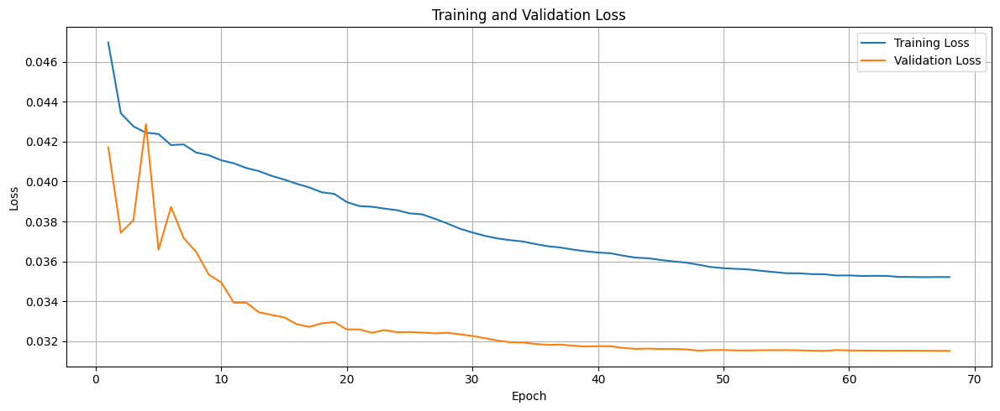

306/306 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step
y_pred_2day.shape = (9770, 48)
inv_y_pred_2day.shape = (9770, 48, 1)
inv_y_test_2day.shape = (9770, 48, 1)
Day = 0
mae: 3.0920851288721765
mse: 29.20979067189026
rmse: 5.404608281077387
r2: 0.6559556584308885
mape: 0.1306428581504044
mnbe: -5.584662894660759
r_coeff: [0.94414468]


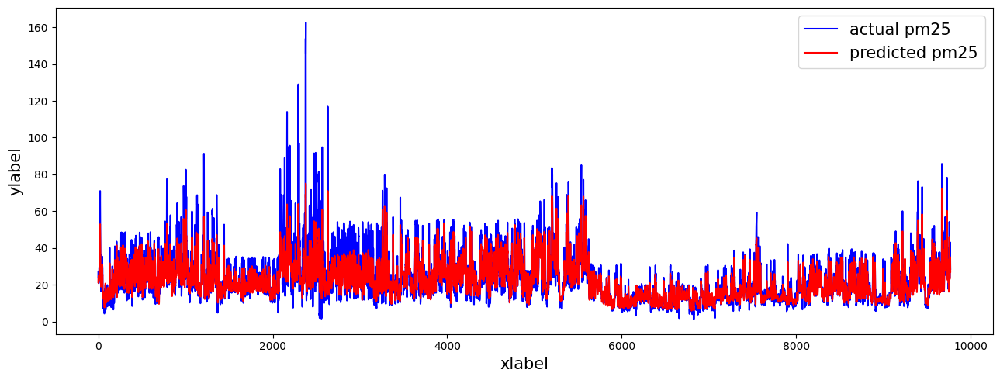

Day = 1
mae: 4.942915276406452
mse: 66.27107356728277
rmse: 8.140704734068345
r2: -0.009615154784784474
mape: 0.2207534862350518
mnbe: -8.13679325714739
r_coeff: [0.81484729]


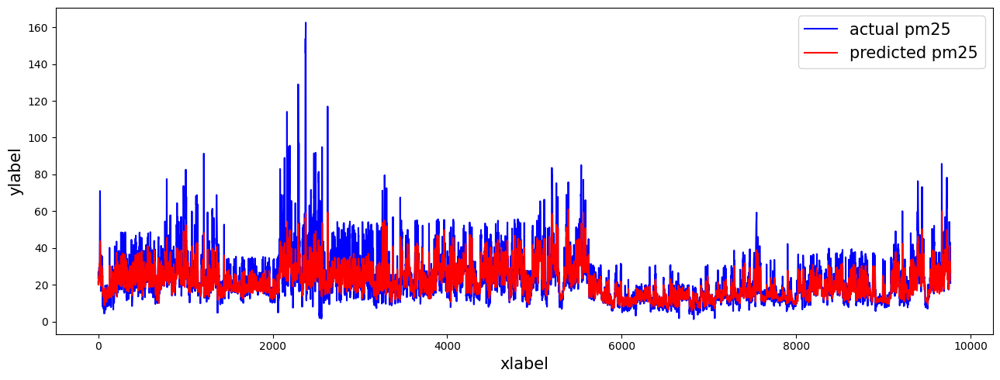

Day = 2
mae: 6.003683093942355
mse: 92.82824313430719
rmse: 9.63474146691582
r2: -0.7532159371262921
mape: 0.27819403777601687
mnbe: -10.281462962531478
r_coeff: [0.71062246]


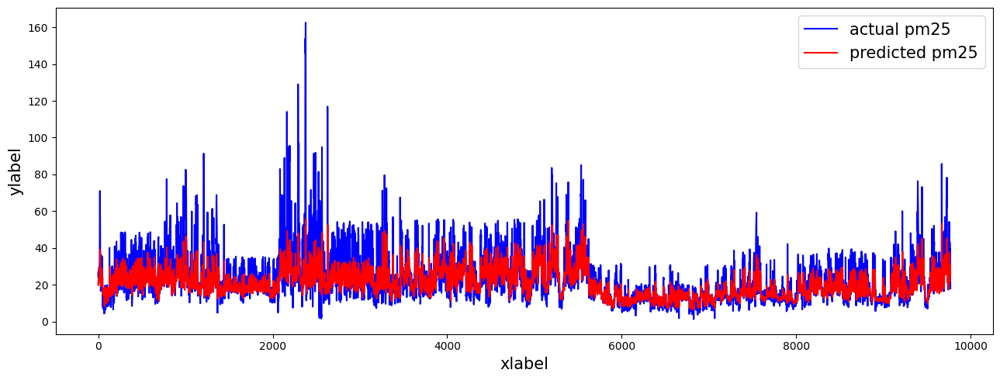

Day = 3
mae: 6.584608250469667
mse: 109.54608537561593
rmse: 10.466426581007289
r2: -1.471388288001426
mape: 0.313049490459375
mnbe: -11.785230467923338
r_coeff: [0.64027514]


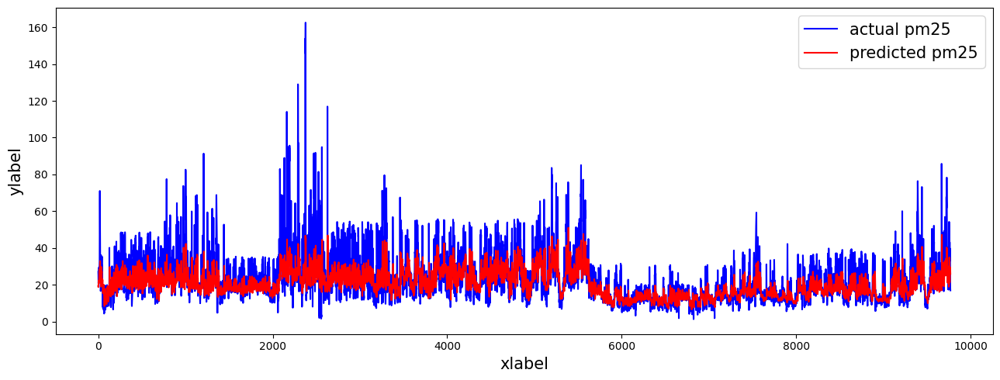

Day = 4
mae: 6.97173156262803
mse: 120.62212645635685
rmse: 10.98281049897324
r2: -2.0359367757253697
mape: 0.33819768074806655
mnbe: -12.97987533957952
r_coeff: [0.59012835]


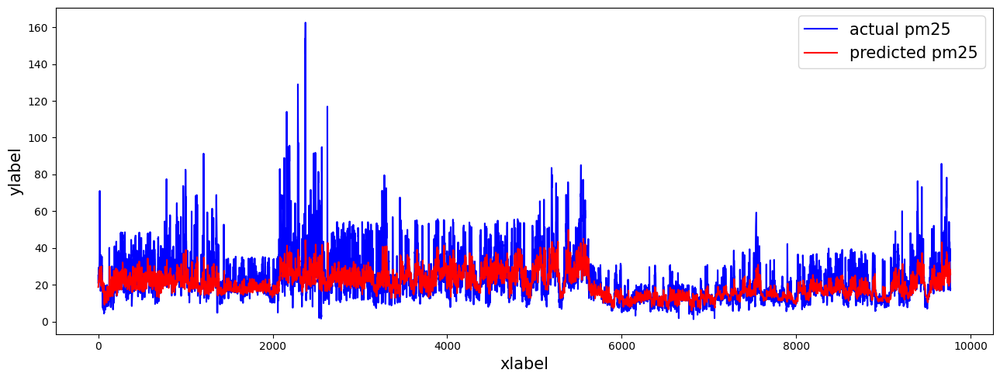

Day = 5
mae: 7.178116633494104
mse: 125.98334620755824
rmse: 11.224230316933017
r2: -2.3907973874891946
mape: 0.34989972413331455
mnbe: -13.102045744638232
r_coeff: [0.56116758]


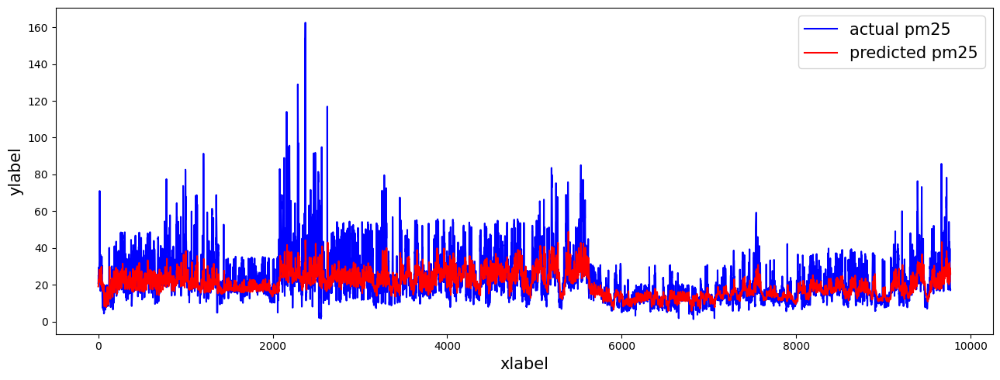

Day = 6
mae: 7.294998091077457
mse: 128.84416589489277
rmse: 11.350954404581703
r2: -2.6345119281959573
mape: 0.35610942133021495
mnbe: -13.12667104146829
r_coeff: [0.54519934]


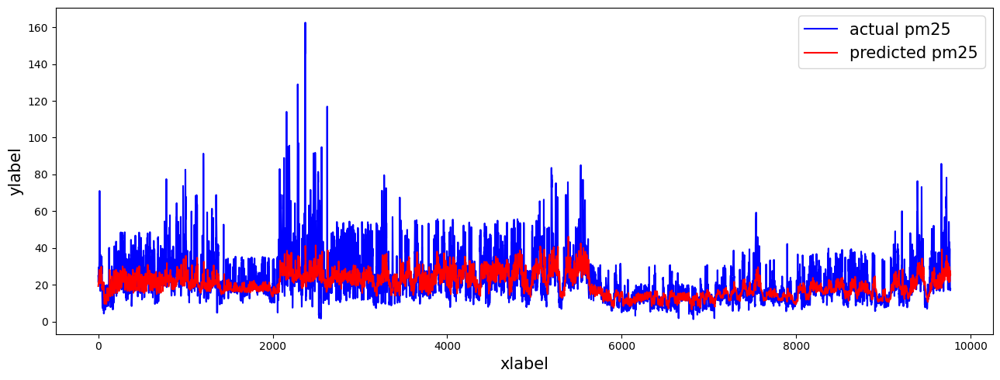

Day = 7
mae: 7.357818684072221
mse: 131.25403018841936
rmse: 11.456615127882204
r2: -2.922513295648775
mape: 0.36111133547748514
mnbe: -13.535031000222169
r_coeff: [0.53572834]


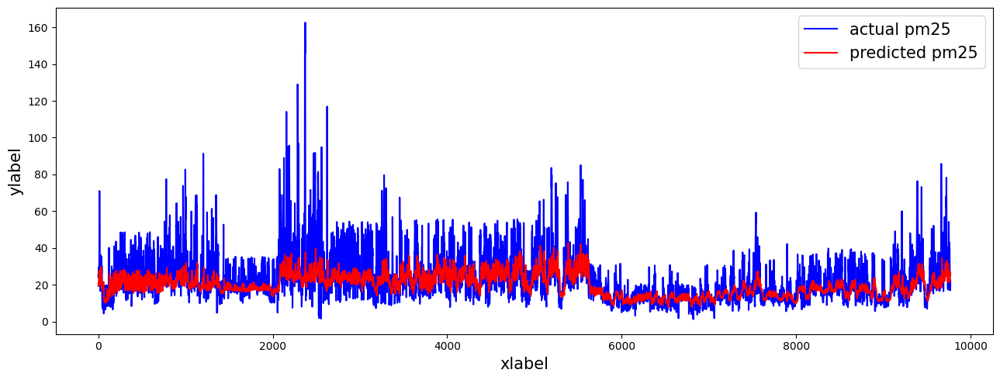

Day = 8
mae: 7.446204936866112
mse: 133.36549507204148
rmse: 11.548397943959218
r2: -2.9507731976045037
mape: 0.3681641565220498
mnbe: -13.987474558704518
r_coeff: [0.52575652]


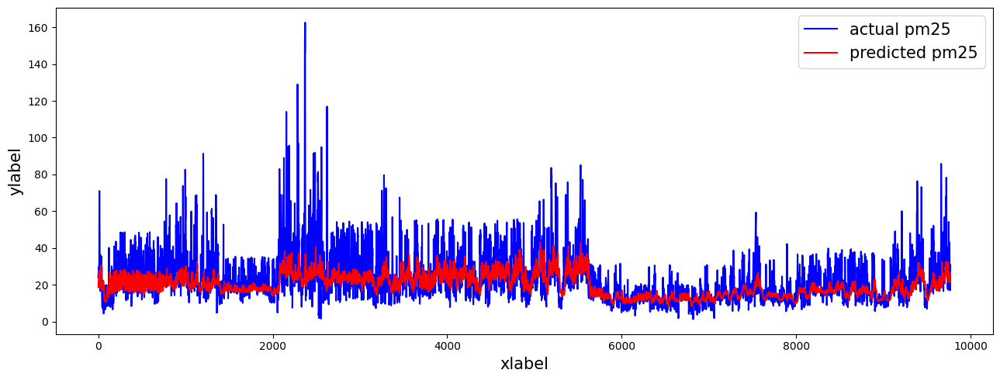

Day = 9
mae: 7.505133459307936
mse: 136.03654163718124
rmse: 11.663470394234352
r2: -3.1912433238470834
mape: 0.3732658243575541
mnbe: -14.58883070546472
r_coeff: [0.51569889]


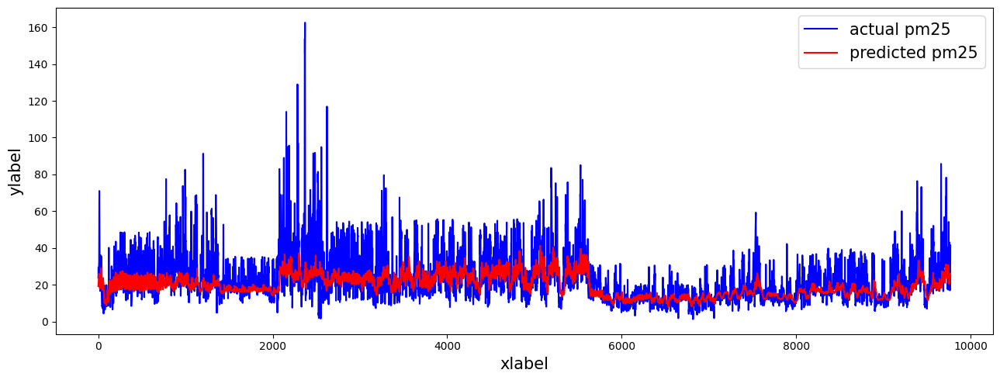

Day = 10
mae: 7.53466638169464
mse: 136.60389467366895
rmse: 11.687766881387947
r2: -3.204977032716191
mape: 0.3739965077843285
mnbe: -14.318724298225188
r_coeff: [0.5095348]


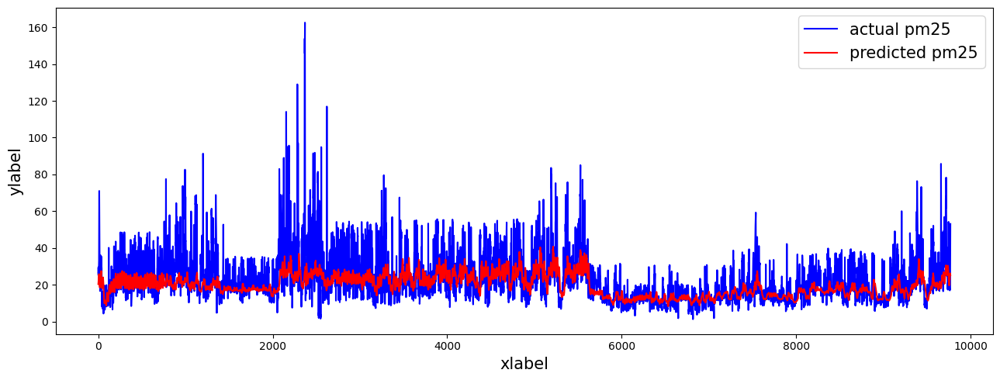

Day = 11
mae: 7.5731809819205615
mse: 137.5388429784305
rmse: 11.72769555276869
r2: -3.114100947983464
mape: 0.3773433326716511
mnbe: -14.39602338253249
r_coeff: [0.50367293]


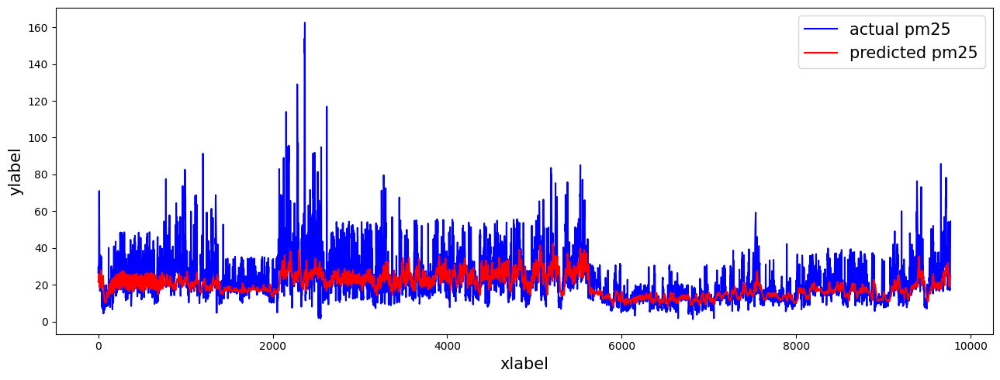

Day = 12
mae: 7.538456257670545
mse: 135.8540164595252
rmse: 11.655643116513357
r2: -2.8801801086385934
mape: 0.3736023535756577
mnbe: -13.984681120484252
r_coeff: [0.50992114]


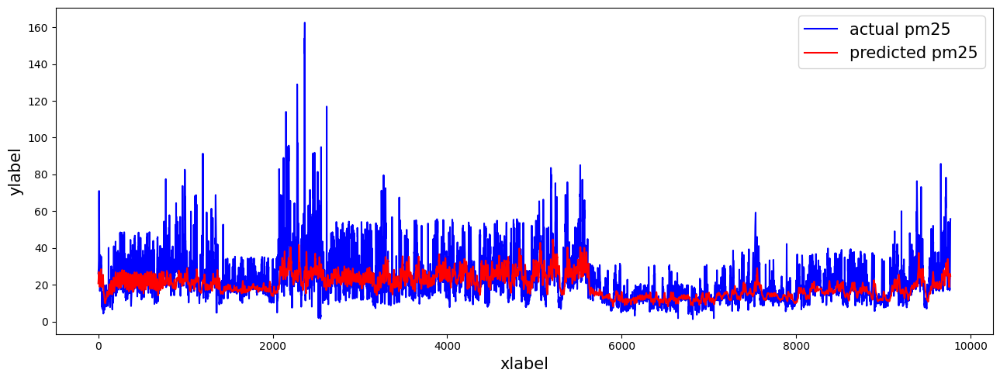

Day = 13
mae: 7.577750698317595
mse: 137.868949066361
rmse: 11.741760901430458
r2: -2.9821046716202613
mape: 0.37908480824051227
mnbe: -14.664575601089696
r_coeff: [0.50429874]


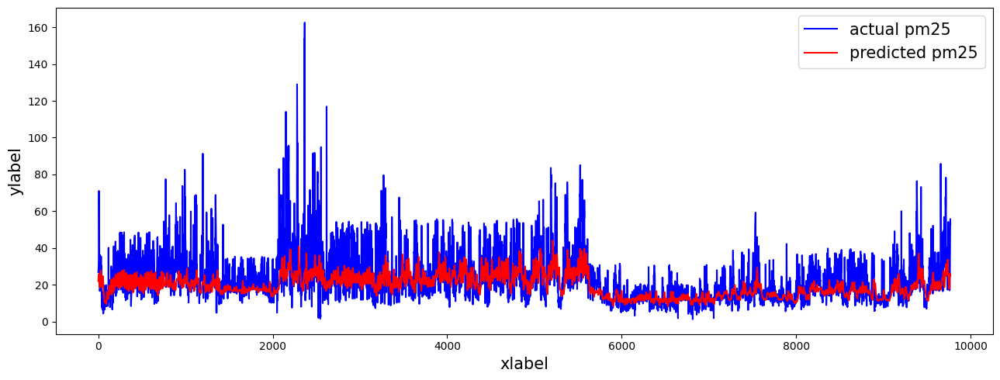

Day = 14
mae: 7.518323636785266
mse: 135.04198342680832
rmse: 11.62075657721167
r2: -2.833276117521065
mape: 0.37238579852532333
mnbe: -13.871779101469173
r_coeff: [0.51470883]


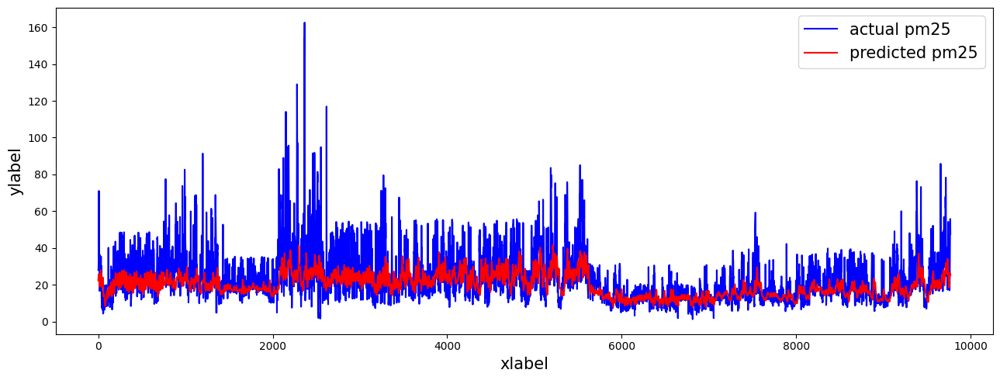

Day = 15
mae: 7.587764176755825
mse: 138.33769726976664
rmse: 11.76170469233804
r2: -3.0682350376557173
mape: 0.3808799842242602
mnbe: -15.034734338558398
r_coeff: [0.50601611]


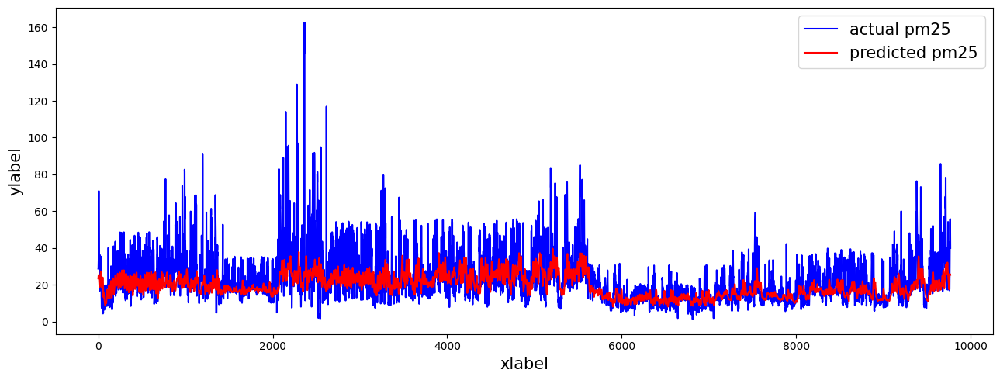

Day = 16
mae: 7.552398386489126
mse: 136.82794322457954
rmse: 11.6973477004225
r2: -2.972544807740252
mape: 0.3763652645951912
mnbe: -14.45515547792509
r_coeff: [0.50963026]


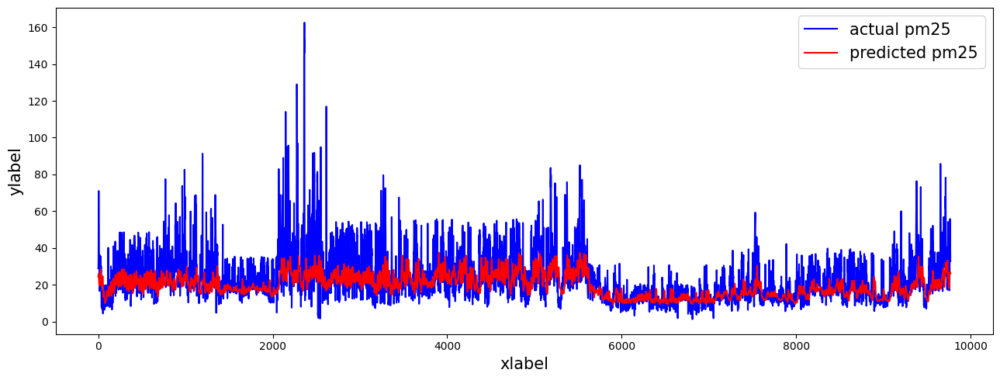

Day = 17
mae: 7.574672822575451
mse: 138.5327597473622
rmse: 11.76999404194251
r2: -3.1026767972590346
mape: 0.37922160884538775
mnbe: -14.866300218529915
r_coeff: [0.50317769]


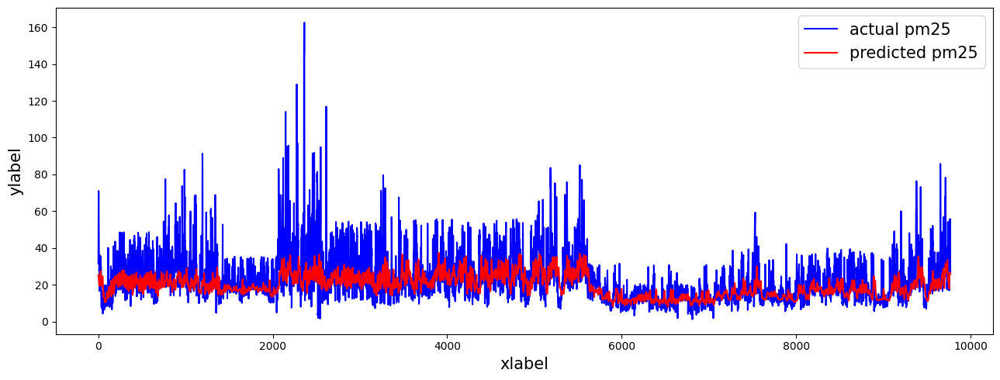

Day = 18
mae: 7.623932668327041
mse: 140.36950392524744
rmse: 11.847763667682075
r2: -3.2258343700311487
mape: 0.3849385306898947
mnbe: -15.362556653163779
r_coeff: [0.49667639]


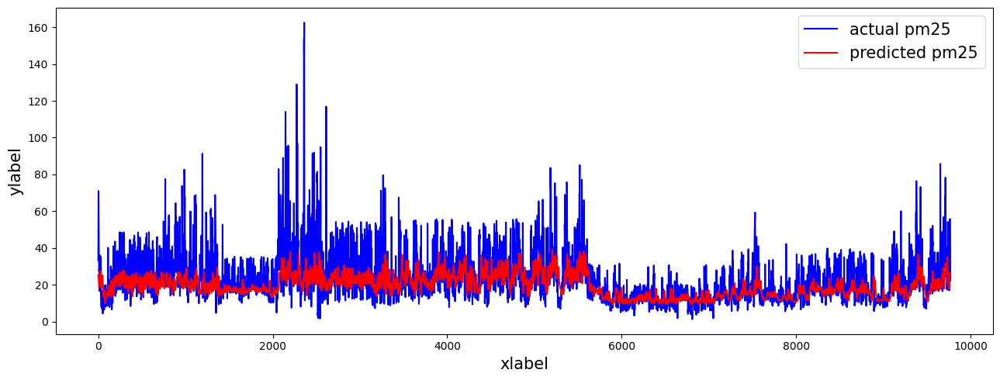

Day = 19
mae: 7.649389001470194
mse: 141.13348340368017
rmse: 11.879961422651176
r2: -3.3168886865409357
mape: 0.3864320476141488
mnbe: -15.389545104294214
r_coeff: [0.49225868]


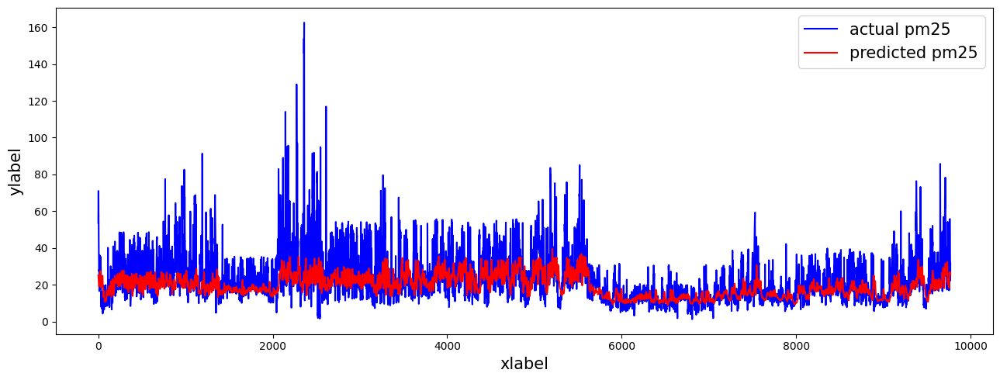

Day = 20
mae: 7.637388374170092
mse: 141.27679284866744
rmse: 11.885991454172741
r2: -3.413742795644321
mape: 0.3860924373459616
mnbe: -15.575953212811259
r_coeff: [0.49349674]


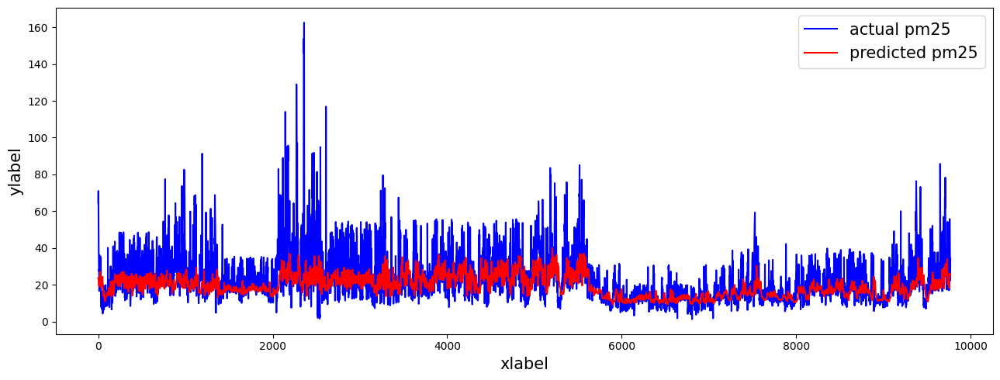

Day = 21
mae: 7.657512600426976
mse: 141.71615015295575
rmse: 11.904459254958024
r2: -3.4343104660373083
mape: 0.38708238919826365
mnbe: -15.51098885071702
r_coeff: [0.48903183]


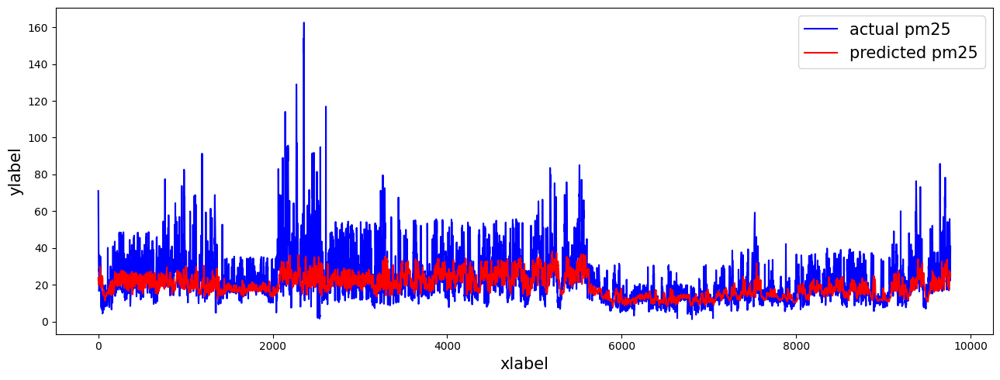

Day = 22
mae: 7.675554878565639
mse: 142.04266115772626
rmse: 11.918165175803122
r2: -3.5184153877922224
mape: 0.38861669180502223
mnbe: -15.47802184304449
r_coeff: [0.4859437]


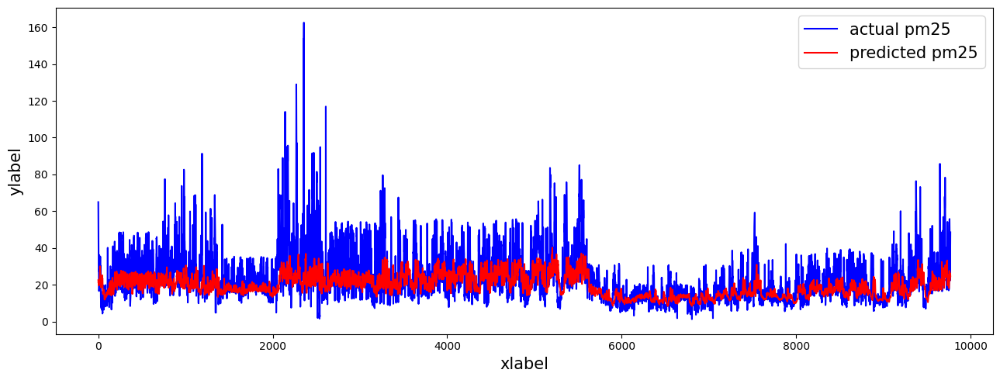

Day = 23
mae: 7.6717078432044525
mse: 141.7891889543145
rmse: 11.907526567441053
r2: -3.574923022557309
mape: 0.3887818512362437
mnbe: -15.424579777987587
r_coeff: [0.48646864]


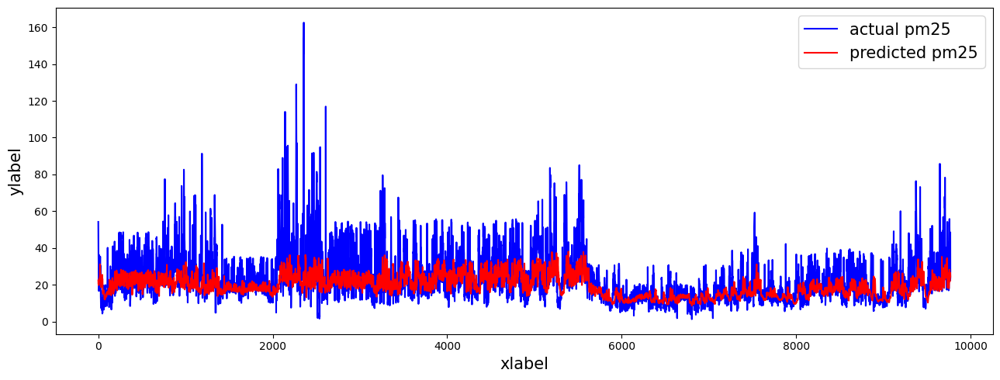

Day = 24
mae: 7.71116261788848
mse: 142.39217480093393
rmse: 11.932819231050722
r2: -3.8544662739205124
mape: 0.3912027637438485
mnbe: -15.596029965672045
r_coeff: [0.48537112]


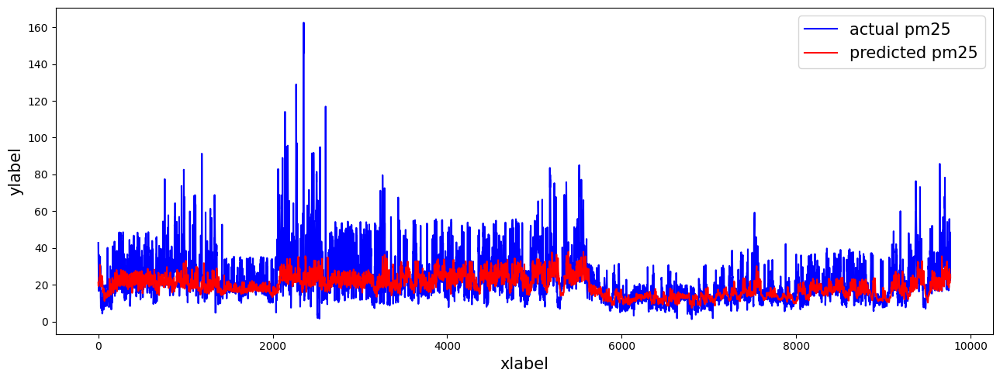

Day = 25
mae: 7.765802654305179
mse: 144.04574934418508
rmse: 12.001906071294888
r2: -4.137829089294038
mape: 0.3951818544000997
mnbe: -15.757456582592011
r_coeff: [0.47673126]


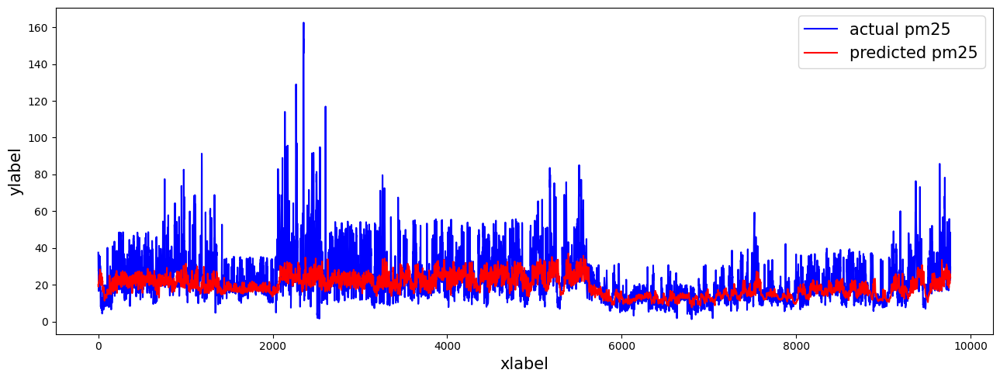

Day = 26
mae: 7.895430285158791
mse: 148.33671546749466
rmse: 12.179356118756633
r2: -4.681404002256313
mape: 0.4051559431642575
mnbe: -16.431097839826517
r_coeff: [0.45566294]


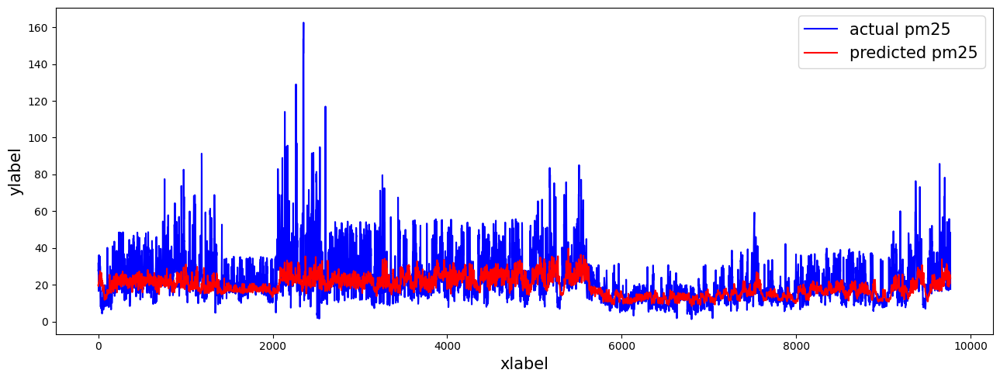

Day = 27
mae: 7.971062939045289
mse: 151.2765868725972
rmse: 12.299454738832823
r2: -5.165902120940485
mape: 0.4129661859298329
mnbe: -17.137784388010495
r_coeff: [0.44467247]


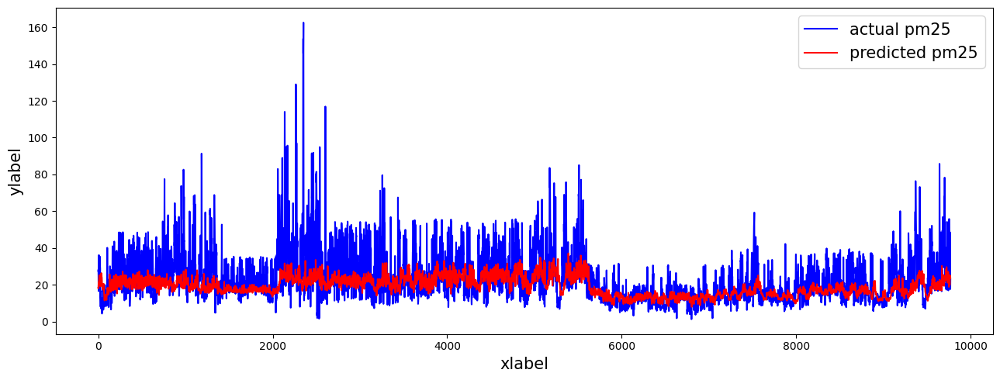

Day = 28
mae: 7.970243749630705
mse: 150.41398779577602
rmse: 12.264338049637088
r2: -4.934966980905165
mape: 0.41092251390637125
mnbe: -16.386263160630484
r_coeff: [0.44005746]


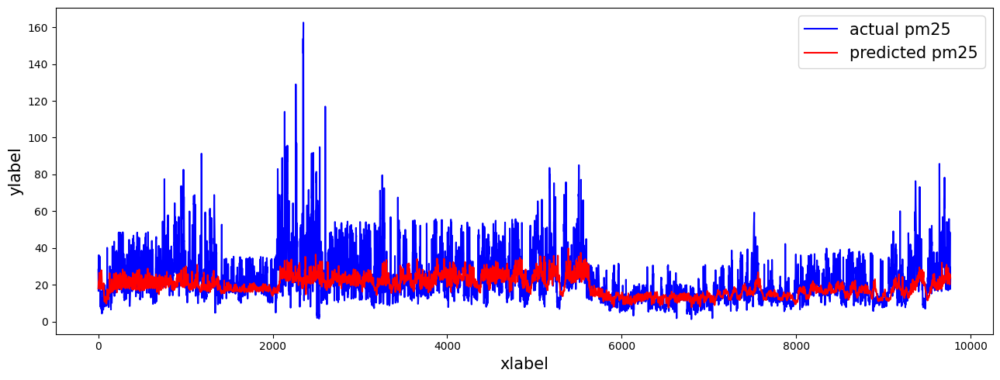

Day = 29
mae: 8.046879615559574
mse: 155.33070675462326
rmse: 12.463174024084847
r2: -5.702493777193039
mape: 0.42277234677348946
mnbe: -17.92169298009719
r_coeff: [0.42582277]


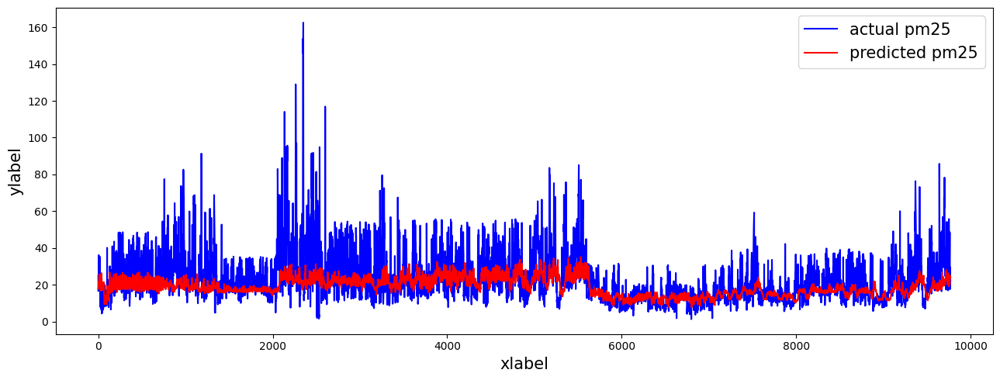

Day = 30
mae: 8.082653873536326
mse: 155.81104964168128
rmse: 12.482429636960958
r2: -5.621626668734377
mape: 0.42530957912369016
mnbe: -17.8988998388459
r_coeff: [0.42125493]


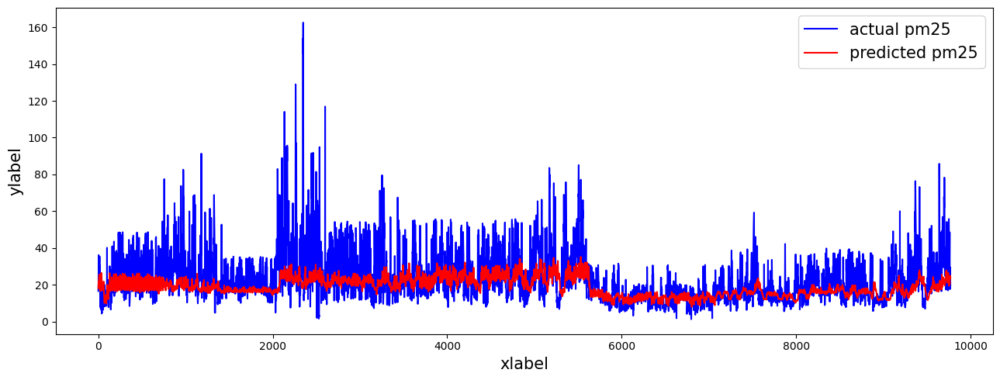

Day = 31
mae: 8.05227553647184
mse: 153.48735339519288
rmse: 12.389001307417514
r2: -5.361992016730682
mape: 0.4194211878701088
mnbe: -17.16382086584626
r_coeff: [0.42817645]


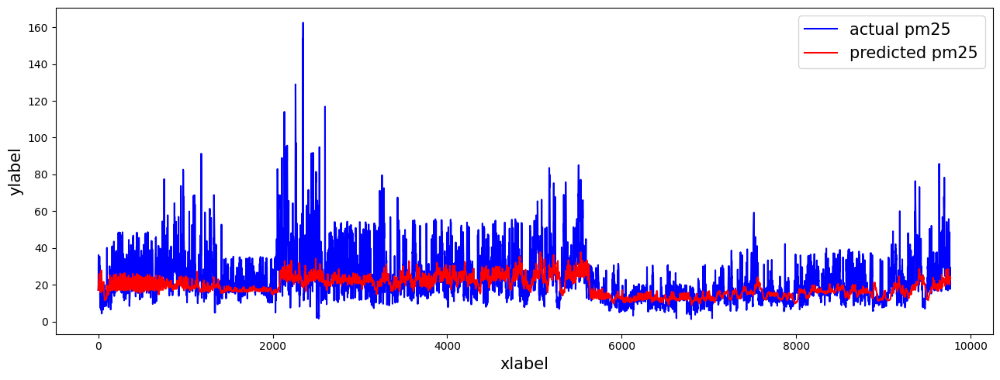

Day = 32
mae: 8.107716340625624
mse: 155.3548363310446
rmse: 12.464142021456775
r2: -5.38176549470805
mape: 0.4249386662135171
mnbe: -17.653216291547018
r_coeff: [0.42042077]


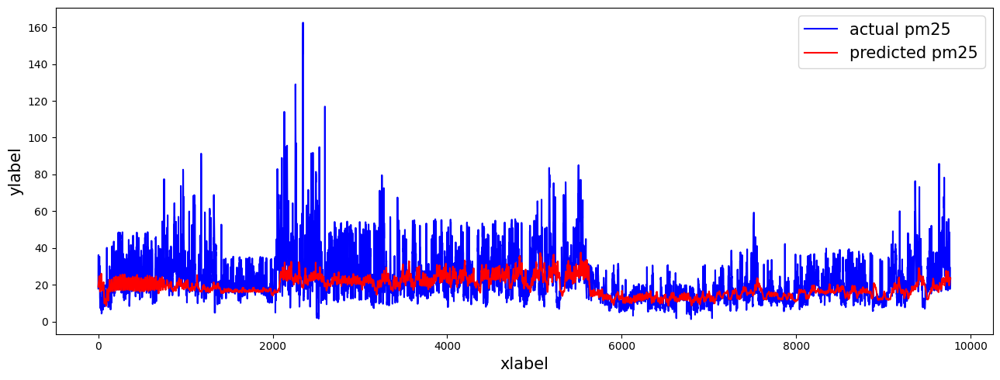

Day = 33
mae: 8.084957328386642
mse: 154.32496650238863
rmse: 12.422760019512115
r2: -5.373015196922019
mape: 0.42113212716815857
mnbe: -17.266600547208615
r_coeff: [0.42297486]


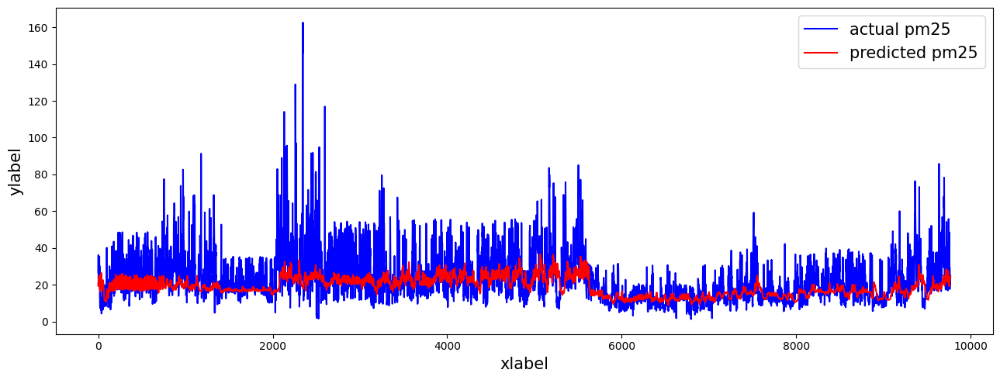

Day = 34
mae: 8.071359600723673
mse: 153.44852947392812
rmse: 12.38743433782509
r2: -5.151996489962111
mape: 0.4189463720523286
mnbe: -17.00939136561613
r_coeff: [0.42554849]


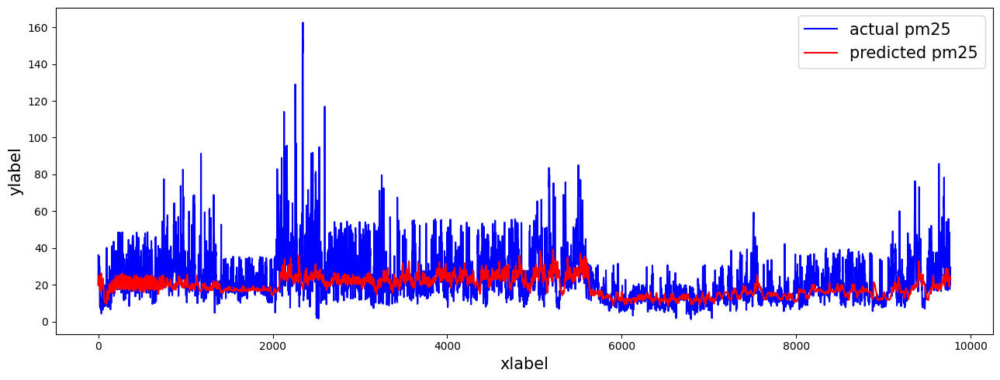

Day = 35
mae: 8.076477844397639
mse: 153.55530732000685
rmse: 12.391743514130965
r2: -5.024074877621634
mape: 0.419490271572144
mnbe: -16.918010752490893
r_coeff: [0.42296809]


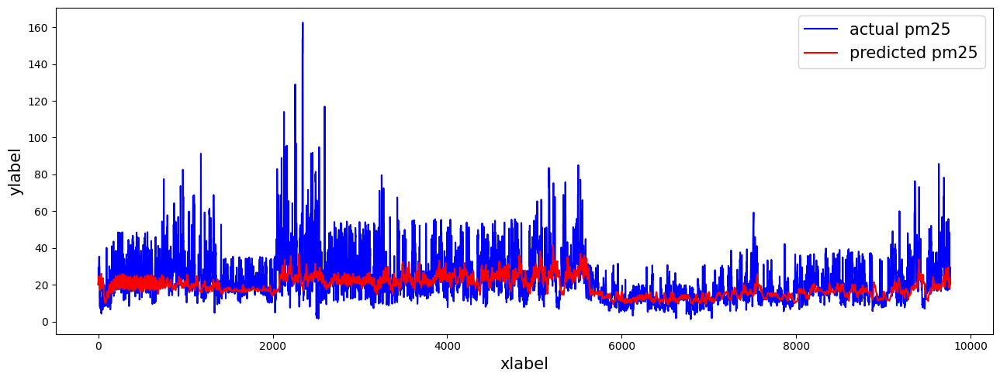

Day = 36
mae: 8.055128740525848
mse: 152.9890054676655
rmse: 12.368872441239965
r2: -5.121303915764972
mape: 0.41860398516968295
mnbe: -16.935045483788834
r_coeff: [0.42794753]


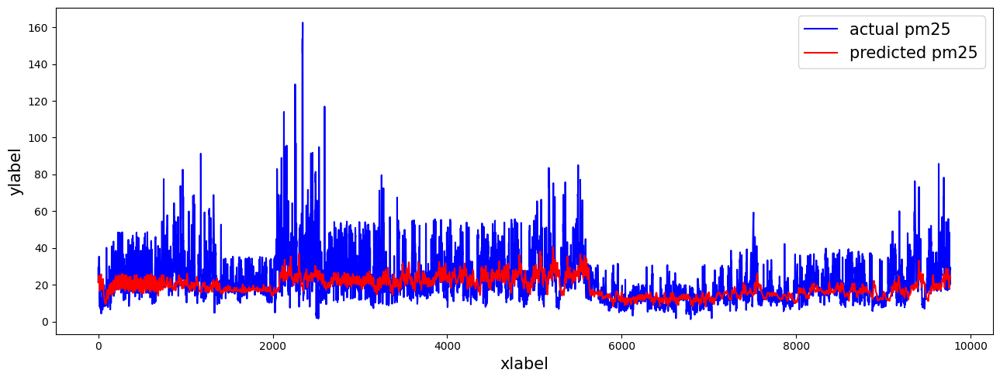

Day = 37
mae: 8.07506866724561
mse: 153.9121280957215
rmse: 12.406132680884946
r2: -5.241300701252475
mape: 0.4210435692861923
mnbe: -17.305776007627767
r_coeff: [0.42635628]


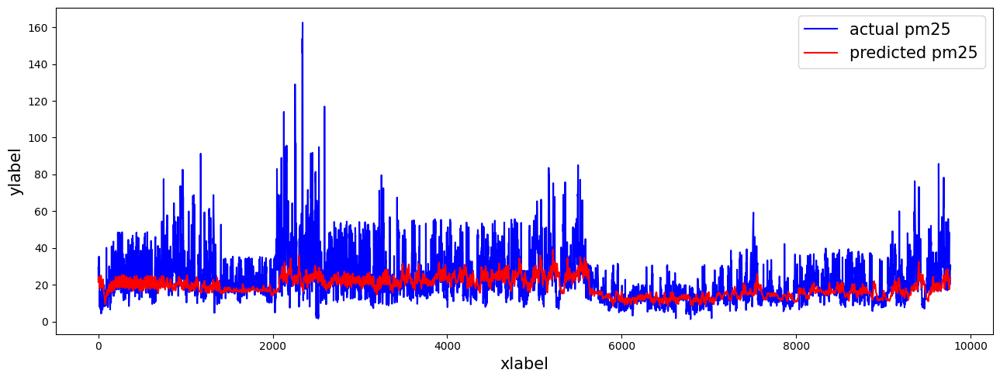

Day = 38
mae: 8.119748545039421
mse: 155.4434598951437
rmse: 12.467696655563275
r2: -5.269897550190972
mape: 0.42504114599307513
mnbe: -17.483123703161997
r_coeff: [0.41690452]


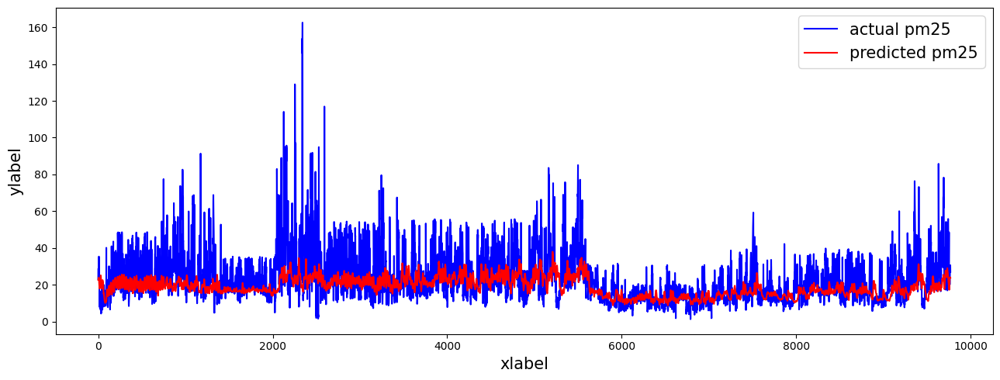

Day = 39
mae: 8.106327230006233
mse: 155.2315870149713
rmse: 12.45919688483055
r2: -5.315291658183414
mape: 0.42407890907446266
mnbe: -17.503507772227287
r_coeff: [0.41896468]


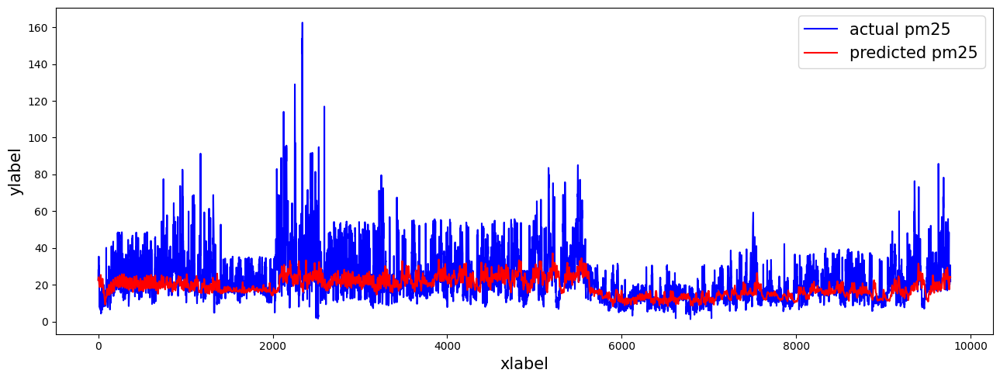

Day = 40
mae: 8.079816361396743
mse: 154.51999227580836
rmse: 12.430607075915816
r2: -5.439388562294248
mape: 0.4227019784614667
mnbe: -17.491245871405393
r_coeff: [0.42487168]


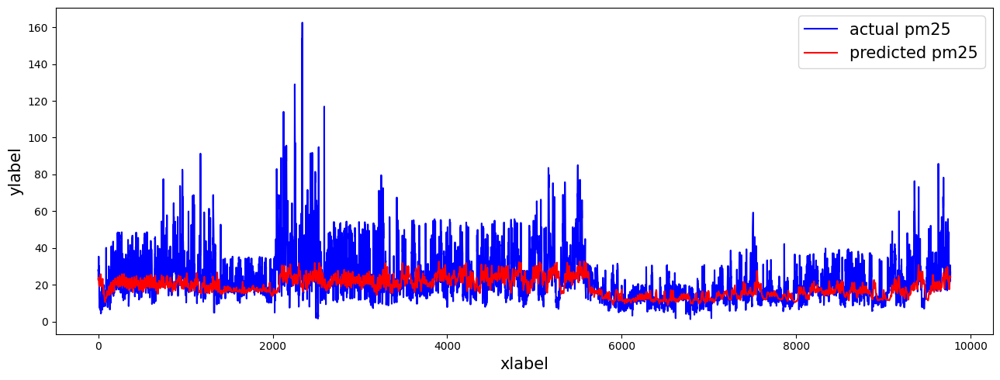

Day = 41
mae: 8.181514365024798
mse: 157.8397105318141
rmse: 12.563427499365533
r2: -5.707477032866383
mape: 0.43241666212126884
mnbe: -18.074465374425355
r_coeff: [0.40772099]


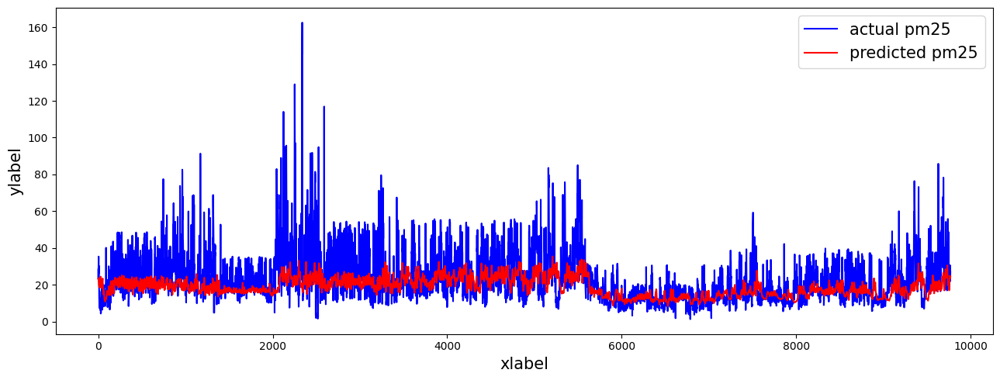

Day = 42
mae: 8.107527880175086
mse: 154.66147582573097
rmse: 12.436296708656117
r2: -5.5349012218617455
mape: 0.4228386120403921
mnbe: -17.169180718560742
r_coeff: [0.4194689]


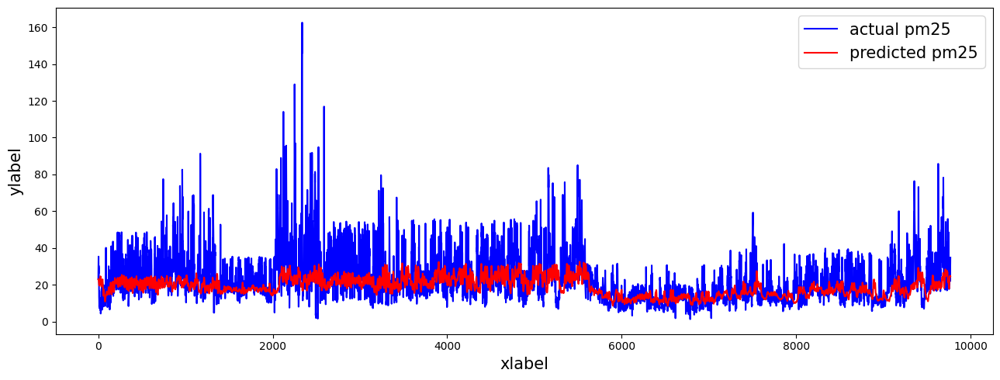

Day = 43
mae: 8.19097986411518
mse: 158.70571365854752
rmse: 12.597845595916292
r2: -6.236997444087944
mape: 0.4355246903942423
mnbe: -18.730402723637436
r_coeff: [0.41282663]


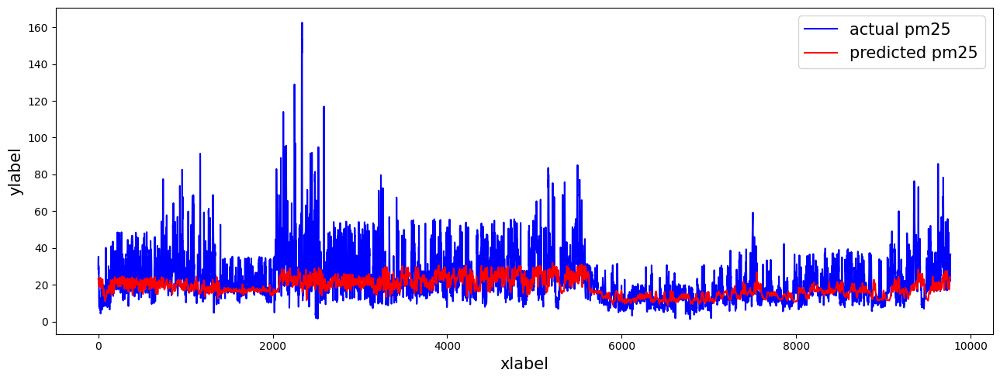

Day = 44
mae: 8.196375571719608
mse: 158.23225552591447
rmse: 12.579040326110512
r2: -6.279193270067669
mape: 0.4347853212814756
mnbe: -18.496961214861678
r_coeff: [0.4133962]


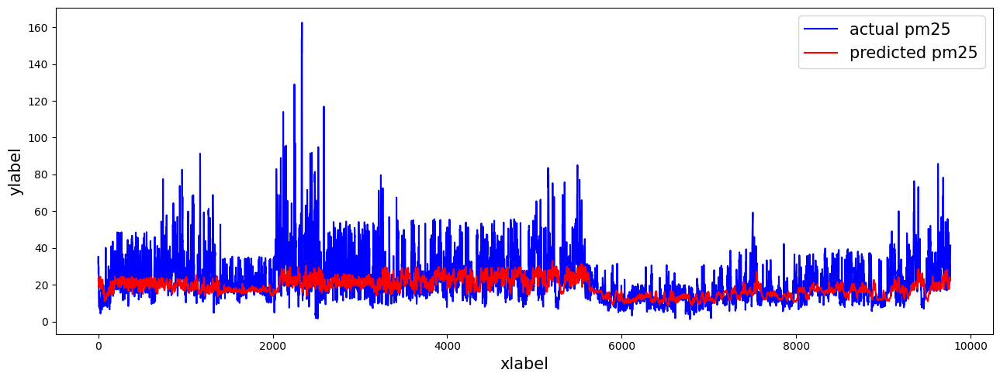

Day = 45
mae: 8.192800938641867
mse: 157.63628457319749
rmse: 12.555328931302338
r2: -6.200351544442662
mape: 0.4316975005937279
mnbe: -18.03512029285255
r_coeff: [0.41124858]


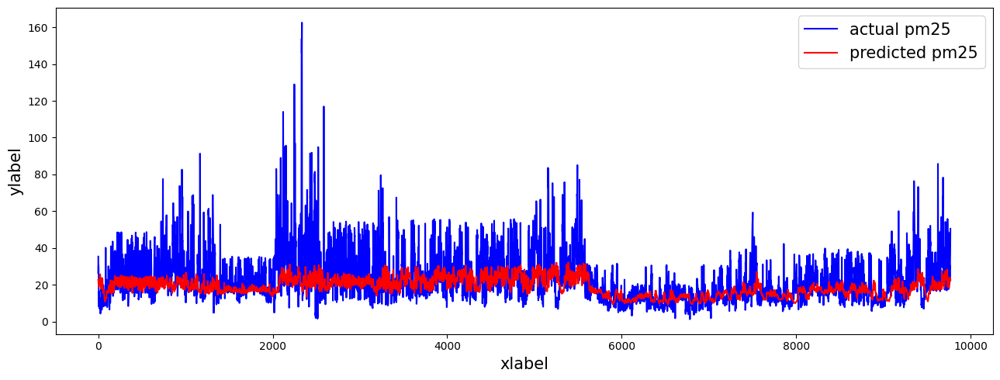

Day = 46
mae: 8.219198467338975
mse: 158.04501026166565
rmse: 12.571595374560289
r2: -6.301593472672621
mape: 0.4320374398710883
mnbe: -17.85913090810484
r_coeff: [0.4060356]


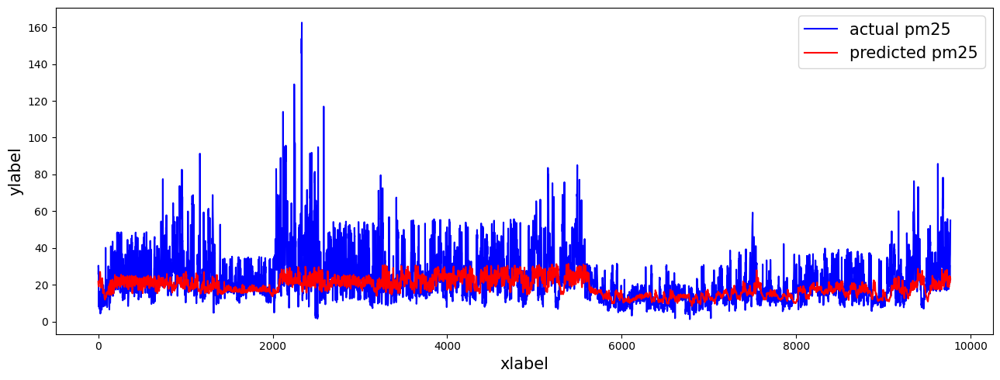

Day = 47
mae: 8.245975175461204
mse: 160.26962746645808
rmse: 12.659764115751054
r2: -7.004195707204442
mape: 0.43915508704104633
mnbe: -19.085442047831
r_coeff: [0.40976786]


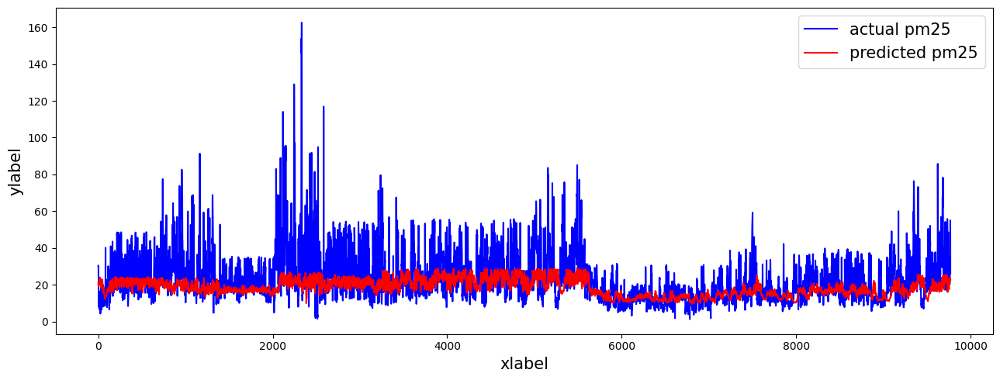

In [15]:
n_future = 48

lstms2s = define_lstms2s_model(n_past, n_future, X_train_2day.shape[-1], y_train_2day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_2day, y_train_2day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_2day = lstms2s.predict(X_test_2day)
print(f"y_pred_2day.shape = {y_pred_2day.shape}")

inv_y_pred_2day = np.expand_dims(label_scaler.inverse_transform(y_pred_2day), -1)
inv_y_test_2day = np.expand_dims(label_scaler.inverse_transform(y_test_2day[:, :, 0]), -1)
print(f"inv_y_pred_2day.shape = {inv_y_pred_2day.shape}\ninv_y_test_2day.shape = {inv_y_test_2day.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_2day[:, day, :], inv_y_test_2day[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")

#### Predict at day 2, t = 4

Model: "lstms2s_day_2_t4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 168, 10)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 168, 128)       │        71,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,801 (487.50 KB)

 Trainable params: 124,801 (487.50 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step - loss: 0.0431 - val_loss: 0.0507 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0438 - val_loss: 0.0480 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step - loss: 0.0427 - val_loss: 0.0470 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - loss: 0.0431 - val_loss: 0.0412 - learning_rate: 0.0010
Epoch 5/100
248/249 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0443
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0427 - val_loss: 0.0485 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0413 - val_loss: 0.0485 - learning_rate: 5.0000e-04
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - loss: 0.0421 - val_loss: 0.0389 - learning_rate: 5.0000e-04
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.04

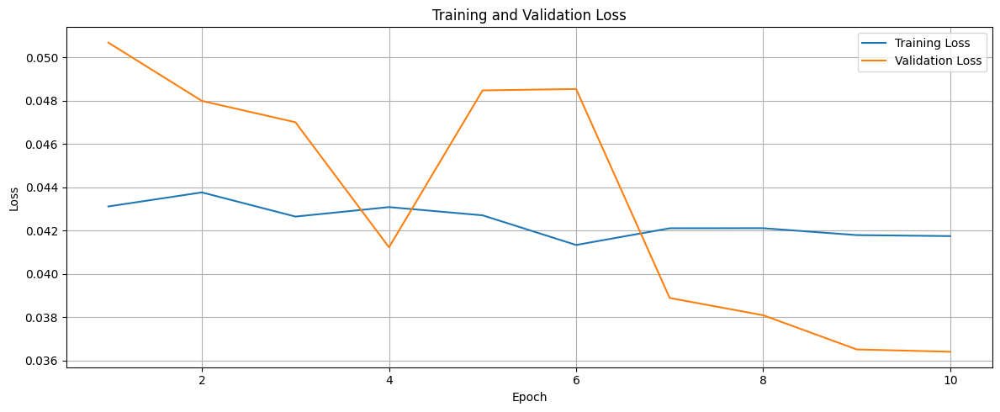

306/306 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
y_pred_day_2_t4.shape = (9789, 1)
inv_y_pred_day_2_t4.shape = (9789, 1, 1)
inv_y_test_day_2_t4.shape = (9789, 1, 1)
Day = 0
mae: 12.427663411141372
mse: 305.4460140764259
rmse: 17.47701387756003
r2: -224.7505175241135
mape: 1.113141181734208
mnbe: -52.36191764648018
r_coeff: [0.32749607]


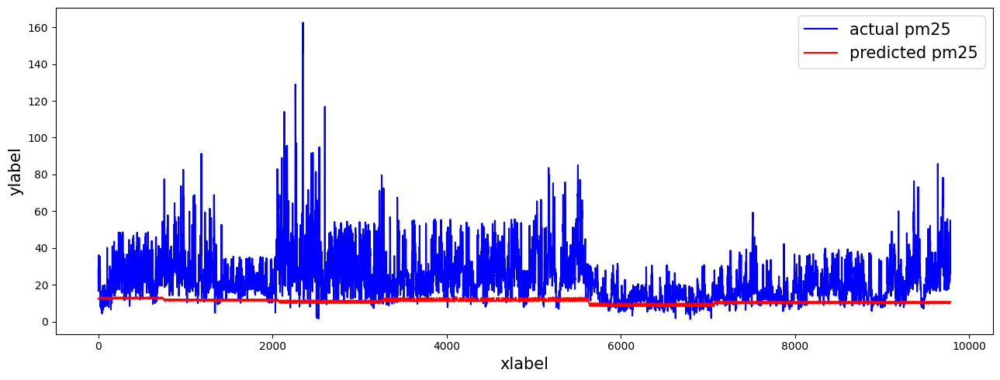

In [18]:
n_future = 1

lstms2s = define_lstms2s_model(n_past, n_future, X_train_day_2_t4.shape[-1], y_train_day_2_t4.shape[-1], f"lstms2s_day_2_t4")

history = lstms2s.fit(X_train_day_2_t4, y_train_day_2_t4,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_day_2_t4 = lstms2s.predict(X_test_day_2_t4)
print(f"y_pred_day_2_t4.shape = {y_pred_day_2_t4.shape}")

inv_y_pred_day_2_t4 = np.expand_dims(label_scaler.inverse_transform(y_pred_day_2_t4), -1)
inv_y_test_day_2_t4 = np.expand_dims(label_scaler.inverse_transform(y_test_day_2_t4[:, :, 0]), -1)
print(f"inv_y_pred_day_2_t4.shape = {inv_y_pred_day_2_t4.shape}\ninv_y_test_day_2_t4.shape = {inv_y_test_day_2_t4.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_day_2_t4[:, day, :], inv_y_test_day_2_t4[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")

#### 72 hours

In [ ]:
n_future = 72

lstms2s = define_lstms2s_model(n_past, n_future, X_train_3day.shape[-1], y_train_3day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_3day, y_train_3day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_3day = lstms2s.predict(X_test_3day)
y_pred_3day = np.expand_dims(y_pred_3day, -1)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    current_day_y_pred, current_day_y_test = y_pred_3day[:, day, :], y_test_3day[:, day, :]
    inv_y_test, inv_y_pred = label_scaler.inverse_transform(current_day_y_test)[:-(day+1)], label_scaler.inverse_transform(current_day_y_pred)[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="inv_y_test", data2=inv_y_pred, datalabel2="inv_y_pred")
    print("Plot for 1 sample")
    plot_2_data(data1=inv_y_test[0], datalabel1="pred", data2=inv_y_test[0], datalabel2="actual")

### GRU-Seq2Seq

In [ ]:
def define_grus2s_model(n_past, n_future, n_features, n_label, name="model"):
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_gru_1 = GRU(128, return_sequences=True, activation="relu")(encoder_inputs)
    decoder_gru_2 = GRU(64, activation="relu", dropout=0.2)(encoder_gru_1)
    decoder_dense = Dense(32, activation="relu")(decoder_gru_2)
    decoder_outputs = Dense(n_future)(decoder_dense)

    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

In [ ]:
stop

#### 48 hours

In [ ]:
n_future = 48

lstms2s = define_lstms2s_model(n_past, n_future, X_train_2day.shape[-1], y_train_2day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_2day, y_train_2day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_2day = lstms2s.predict(X_test_2day)
y_pred_2day = np.expand_dims(y_pred_2day, -1)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    current_day_y_pred, current_day_y_test = y_pred_2day[:, day, :], y_test_2day[:, day, :]
    inv_y_test, inv_y_pred = label_scaler.inverse_transform(current_day_y_test)[:-(day+1)], label_scaler.inverse_transform(current_day_y_pred)[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="inv_y_test", data2=inv_y_pred, datalabel2="inv_y_pred")
    print("Plot for 1 sample")
    plot_2_data(data1=inv_y_test[0], datalabel1="pred", data2=inv_y_test[0], datalabel2="actual")

#### 72 hours

In [ ]:
n_future = 72

lstms2s = define_lstms2s_model(n_past, n_future, X_train_3day.shape[-1], y_train_3day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_3day, y_train_3day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_3day = lstms2s.predict(X_test_3day)
y_pred_3day = np.expand_dims(y_pred_3day, -1)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    current_day_y_pred, current_day_y_test = y_pred_3day[:, day, :], y_test_3day[:, day, :]
    inv_y_test, inv_y_pred = label_scaler.inverse_transform(current_day_y_test)[:-(day+1)], label_scaler.inverse_transform(current_day_y_pred)[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="inv_y_test", data2=inv_y_pred, datalabel2="inv_y_pred")
    print("Plot for 1 sample")
    plot_2_data(data1=inv_y_test[0], datalabel1="pred", data2=inv_y_test[0], datalabel2="actual")

In [ ]:
stop